# Table of Contents
 <p><div class="lev1 toc-item"><a href="#init" data-toc-modified-id="init-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>init</a></div><div class="lev1 toc-item"><a href="#train" data-toc-modified-id="train-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>train</a></div><div class="lev1 toc-item"><a href="#result" data-toc-modified-id="result-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>result</a></div><div class="lev1 toc-item"><a href="#List-Coefficients" data-toc-modified-id="List-Coefficients-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>List Coefficients</a></div><div class="lev1 toc-item"><a href="#List-Texts" data-toc-modified-id="List-Texts-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>List Texts</a></div><div class="lev1 toc-item"><a href="#Draw-Trees" data-toc-modified-id="Draw-Trees-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Draw Trees</a></div><div class="lev1 toc-item"><a href="#Feature-Histograms" data-toc-modified-id="Feature-Histograms-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Feature Histograms</a></div><div class="lev1 toc-item"><a href="#Confusion-Matrix" data-toc-modified-id="Confusion-Matrix-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Confusion Matrix</a></div><div class="lev1 toc-item"><a href="#Scatter-Plot" data-toc-modified-id="Scatter-Plot-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Scatter Plot</a></div><div class="lev1 toc-item"><a href="#Feature-Selection" data-toc-modified-id="Feature-Selection-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Feature Selection</a></div>

In [1]:
import pandas as pd
from collections import Counter
import pprint
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt

In [2]:
%load_ext autoreload
%autoreload 2
from code.feiii_transformers import _EmbeddingHolder
embedding = _EmbeddingHolder()
embedding.load('embedding')

# init

In [3]:
%load_ext autoreload
%autoreload 2

from code.feiii_experiment import evaluate, kfold
from code.feiii_data import DataHolder
from code.feiii_pipeline import FeiiiPipeline


def pp(obj):
    return pprint.pformat(obj).replace('\n','<br />')

data = DataHolder(eval_docs=2, workingfile=None)
print('done')

out = '<table><tr><th></th><th>TRAINING</th><th>TESTING SET</th></tr>'
out+= '<tr><td>#ROWS</td><td>'+str(len(data.train_full))+'</td><td>'+str(len(data.test))+'</td></tr>'
out+= '<tr><td>ROLES</td><td>'+pp(dict(Counter(data.train_full['grp'])))+'</td><td>'+pp(dict(Counter(data.test['grp'])))+'</td></tr>'
out+= '<tr><td>DOCUMENTS</td><td>'+pp(dict(Counter(data.train_full['SOURCE'])))+'</td><td>'+pp(dict(Counter(data.test['SOURCE'])))+'</td></tr>'
out+= '<tr><td>COMPANIES</td><td>'+pp(dict(Counter(data.train_full['FILER_NAME'])))+'</td><td>'+pp(dict(Counter(data.test['FILER_NAME'])))+'</td></tr>'
out+= '<tr><td>Expert ratings</td><td>'
tmp = Counter(data.train_full['rating'])
out+= "ALL: [H]{:_>4d} [R]{:_>4d} [N]{:_>4d} [I]{:_>4d}<br/>".format(
    tmp.get('highly',0),tmp.get('relevant',0),tmp.get('neutral',0),tmp.get('irrelevant',0))
for c in data.train_full.filter(regex=("RATING")):
    tmp = Counter(data.train_full[c])
    out+="[H]{:_>3d} [R]{:_>3d} [N]{:_>3d} [I]{:_>3d} [x]{:_>3d} ({})<br/>".format(
        tmp.get("Highly relevant", 0), tmp.get("Relevant", 0),
        tmp.get("Neutral", 0),tmp.get("Irrelevant", 0),
        tmp.get(np.nan, 0), c)
out+= '</td><td>'
tmp = Counter(data.test['rating'])
out+= "ALL: [H]{:_>4d} [R]{:_>4d} [N]{:_>4d} [I]{:_>4d}<br/>".format(
    tmp.get('highly',0),tmp.get('relevant',0),tmp.get('neutral',0),tmp.get('irrelevant',0))
out+= '</td></tr>'
out+= '</table>'

HTML(out)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
reading file STATE-STREET_2016.csv with 23 entries.
reading file STATE-STREET_2014.csv with 26 entries.
reading file PNC_2016.csv with 33 entries.
reading file PNC_2014.csv with 38 entries.
reading file JPM_2016.csv with 52 entries.
reading file COMERICA_2016.csv with 11 entries.
reading file FIFTH-THIRD_2014.csv with 36 entries.
reading file CITIGROUP_2014.csv with 52 entries.
reading file AMERICAN-EXPRESS_2015.csv with 11 entries.
reading file BANK-OF-AMERICA_2015.csv with 74 entries.
reading file ALLY_2016.csv with 44 entries.
reading file CITIGROUP_2016.csv with 50 entries.
reading file ALLY_2014.csv with 40 entries.
reading file SUNTRUST_2013.csv with 35 entries.
reading file DISCOVER_2014.csv with 41 entries.
reading file MORGAN-STANLEY_2015.csv with 128 entries.
reading file SUNTRUST_2016.csv with 27 entries.
reading file BBT_2014.csv with 14 entries.
reading file GENERAL-ELECTRIC_2013.csv wi

,TRAINING,TESTING SET
#ROWS,975,900
ROLES,"{'affiliate': 186, 'agent': 61, 'counterpart': 64, 'guarantor': 34, 'insurer': 19, 'issuer': 129, 'seller': 20, 'servicer': 21, 'trustee': 420, 'underwriter': 21}","{'affiliate': 129, 'agent': 40, 'counterpart': 108, 'guarantor': 28, 'insurer': 47, 'issuer': 98, 'seller': 49, 'servicer': 57, 'trustee': 304, 'underwriter': 40}"
DOCUMENTS,"{'1393612-2013-FY': 41, '19617-2015-FY': 52, '28412-2015-FY': 11, '35527-2013-FY': 36, '35527-2014-FY': 46, '36270-m&t-2012': 21, '36270-m&t-2014': 21, '40545-2012-FY': 21, '40729-2013-FY': 40, '40729-2015-FY': 44, '4962-2014-FY': 11, '70858-2012-FY': 88, '70858-2014-FY': 74, '713676-2013-FY': 38, '713676-2015-FY': 33, '73124-2012-FY': 18, '750556-2012-FY': 35, '750556-2015-FY': 27, '831001-2013-FY': 52, '831001-2015-FY': 50, '895421-2014-FY': 128, '92230-2013-FY': 14, '927628-2012-FY': 25, '93751-2013-FY': 26, '93751-2015-FY': 23}","{'1026214-2011-Q2': 64, '1026214-2013-FY': 99, '109380-2014-FY': 13, '1390777-2015-Q1': 26, '1393612-2010-FY': 11, '19617-2011-FY': 67, '28412-2012-FY': 11, '310522-2012-FY': 59, '310522-2013-Q2': 21, '316709-2015-FY': 14, '36104-_2015-FY': 8, '36270-m&t-2010': 18, '40545-2015-FY': 27, '40729-2012-Q3': 23, '4962-2015-FY': 19, '70858-2013-FY': 81, '713676-2014-FY': 33, '73124-2015-FY': 28, '831001-2011-FY': 37, '886982-2013-FY': 36, '895421-2015-FY': 134, '91576-2012-FY': 10, '92230-2010-FY': 21, '927628-2010-FY': 20, '93751-2010-FY': 20}"
COMPANIES,"{'AMERICAN EXPRESS CO': 11, 'Ally Financial Inc': 84, 'BANK OF AMERICA CORP': 162, 'BB&T CORP': 14, 'CAPITAL ONE FINANCIAL CORP': 25, 'CITIGROUP INC': 102, 'COMERICA INC': 11, 'Discover Financial Services': 41, 'FIFTH THIRD BANCORP': 82, 'GENERAL ELECTRIC CO': 21, 'JPMORGAN CHASE & CO': 52, 'M&T BANK CORP': 42, 'MORGAN STANLEY': 128, 'NORTHERN TRUST CORP': 18, 'PNC FINANCIAL SERVICES GROUP INC': 71, 'STATE STREET CORP': 49, 'SUNTRUST BANKS INC': 62}","{'AMERICAN EXPRESS CO': 19, 'Ally Financial Inc': 23, 'BANK OF AMERICA CORP': 81, 'BB&T CORP': 21, 'Bank of New York Mellon Corp': 26, 'CAPITAL ONE FINANCIAL CORP': 20, 'CITIGROUP INC': 37, 'COMERICA INC': 11, 'Discover Financial Services': 11, 'FEDERAL_HOME_LOAN_MORTGAGE_CORP': 163, 'FEDERAL_NATIONAL_MORTGAGE_ASSOCIATION_FANNIE_MAE': 80, 'GENERAL ELECTRIC CO': 27, 'GOLDMAN SACHS GROUP INC': 36, 'JPMORGAN CHASE & CO': 67, 'KEYCORP': 10, 'M&T BANK CORP': 18, 'MORGAN STANLEY': 134, 'NORTHERN TRUST CORP': 28, 'PNC FINANCIAL SERVICES GROUP INC': 33, 'SCHWAB_CHARLES_CORP ': 14, 'STATE STREET CORP': 20, 'US_BANCORP': 8, 'ZIONS BANCORPORATION': 13}"
Expert ratings,ALL: [H]_295 [R]_283 [N]_307 [I]__90[H]149 [R]_93 [N]139 [I]_28 [x]566 (RATING_EXPERT_1)[H]101 [R]_35 [N]_83 [I]__7 [x]749 (RATING_EXPERT_1.1)[H]__0 [R]_20 [N]__0 [I]__0 [x]955 (RATING_EXPERT_10)[H]_58 [R]163 [N]131 [I]_14 [x]609 (RATING_EXPERT_2)[H]__8 [R]__8 [N]_15 [I]_29 [x]915 (RATING_EXPERT_3)[H]__5 [R]_23 [N]__5 [I]__2 [x]940 (RATING_EXPERT_4)[H]__7 [R]_29 [N]_41 [I]__3 [x]895 (RATING_EXPERT_5)[H]_10 [R]_34 [N]__6 [I]_10 [x]915 (RATING_EXPERT_6)[H]_10 [R]_27 [N]_36 [I]__2 [x]900 (RATING_EXPERT_7)[H]_62 [R]__1 [N]__1 [I]_10 [x]901 (RATING_EXPERT_9),ALL: [H]_309 [R]_369 [N]_142 [I]__80


In [93]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import FeatureUnion
from sklearn.pipeline import Pipeline
import code.feiii_transformers as ft

params_ = {
    'cv': {
        'ngram_range': (1, 3),
        'min_df': 0.4,
        'max_df': 0.6,
        'stop_words': 'english'
    },
    'tt': {
        'use_idf': True,
        'sublinear_tf': True,
    },
    'emb': {
        'num_files': 30,
        'num_epoch': 20
    },
    'logit': {
        'loss': 'log',  # ['hinge', 'log', 'perceptron','huber'] # for pred_proba: log or modified_huber
        'penalty': 'l2',
        'shuffle': True,
        'alpha': 1e-4,
        'n_iter': 15,
        'random_state': 42,
        'class_weight': 'balanced'
    },
    'rf': {
        'n_estimators': 20,
        'criterion': 'entropy',  # gini or entropy
        'max_features': 'auto',  # int, float, auto, sqrt, log2, None
        'random_state': 177,
        'class_weight': 'balanced'
    },
    'svm': {
        'C': 1.0,
        'kernel': 'sigmoid',  # linear’, ‘poly’, ‘rbf’, ‘sigmoid’
        'probability': True,
        'class_weight': 'balanced',
        'decision_function_shape': 'ovr',  # ovo, ovr
        'random_state': 42
    }
}

a = [
    'dist_role_ent',
    'mean_word_len',
    'num_adj',
    'num_chars',
    'num_digits',
    'num_dollarsigns',
    'num_numbers',
    'num_punct',
    'num_upper_chars',
    'num_verbs',
    'num_words',
    'ratio_digits',
    'ratio_numbers',
    'ratio_upper_chars',
    'ratio_upper_words']

b= ['num_chars', 'num_digits', 'dist_role_ent', 'dist_role_ent_abs', 'num_words', 'num_numbers', 'num_punct', 
    'num_adj', 'num_dollarsigns', 'num_verbs', 'num_word_repetitions_raw', 'num_word_repetitions_clean', 
    'num_ents_org', 'num_ents_person', 'num_adverbs', 'num_upper_words', 'num_1letter', 'num_upper_chars', 
    'ratio_upper_words', 'ratio_numbers']
#'num_role_mentions', 'role+ent', 'ratio_digits', 'ratio_upper_chars', 
#'ratio_word_repetitions_raw', 'ratio_word_repetitions_clean', 'mean_word_len'
c = ['num_chars', 'dist_role_ent','dist_role_ent_abs','num_words','num_digits','num_numbers', 'num_punct', 
     'num_upper_chars', 'num_upper_words', 'num_word_repetitions_raw', 'num_adj', 'num_word_repetitions_clean', 
     'num_dollarsigns', 'num_verbs', 'num_1letter', 'num_ents_org', 'num_ents_person', 'num_adverbs', 
     'num_role_mentions', 'role+ent','mean_word_len', 'ratio_upper_words']
 #('ratio_numbers', 0.012116322644091961),
 #('ratio_word_repetitions_clean', 0.0044467781902558286),
 #('ratio_word_repetitions_raw', 0.0027862430297640808),
 #('ratio_upper_chars', 0.0017501635996505823),
 #('ratio_digits', 0.0014332142939515664)]

def pipeline():
    # ('svc', SVC(**params_['svm']))
    # ('logit', SGDClassifier(**params_['logit']))
    return FeiiiPipeline(line=[
            ('feats', ft.SyntaxFeatures(features=b)),
            ('clf', RandomForestClassifier(**params_['rf']))
        ], embedding=embedding)

def score_func(x):
    kind = 'mulmax'
    if kind=='last':
        xx = x[-1]
    elif kind=='mulmax':
        xx = (x.argmax(axis=1)+1)*x.max(axis=1)
    elif kind=='maxadjust':
        xx = np.array([ai-xi[ai:ai+1].sum()+xi[ai+1:].sum() for xi,ai in zip(x,x.argmax(axis=1))])
    elif kind == '1234':
        xx = np.sum(x * np.array([1, 2, 3, 4]), axis=1)
    elif kind == '1246':
        xx = np.sum(x * np.array([1, 2, 4, 6]), axis=1)
    elif kind=='1245':
        xx = np.sum(x * np.array([1, 2, 4, 5]), axis=1)
    else:
        raise AttributeError('meh.')
        
    return (xx-xx.min())/(xx-xx.min()).max()

In [13]:
data.shuffle_train_eval(n_docs_eval=1, max_tries=8)

# train

In [94]:
fm, models, res, macro_res, conf_matrix_role, conf_matrix_full = evaluate(data, pipeline, score_func=score_func, predict_on='test')

Items in training set: 943 (96.72%)
Items in eval set: 32
Items in test set: 900
 = 1875
Number of source documents: 50 total, 23 train, 2 eval 25 test
Absolute (training): IR 82.00, N 305.00, R 264.00, HR 292.00
Relative (training): IR 0.09, N 0.32, R 0.28, HR 0.31
Absolute (eval): IR 8.00, N 2.00, R 19.00, HR 3.00
Relative (eval): IR 0.25, N 0.06, R 0.59, HR 0.09
Role samples for ISSUER in train: 120, eval: 9, test: 98
Role samples for SERVICER in train: 21, eval: 0, test: 57
Role samples for INSURER in train: 19, eval: 0, test: 47
Role samples for AGENT in train: 54, eval: 7, test: 40
Role samples for SELLER in train: 20, eval: 0, test: 49
Role samples for TRUSTEE in train: 414, eval: 6, test: 304
Role samples for UNDERWRITER in train: 21, eval: 0, test: 40
Role samples for AFFILIATE in train: 177, eval: 9, test: 129
Role samples for GUARANTOR in train: 34, eval: 0, test: 28
Role samples for COUNTERPART in train: 63, eval: 1, test: 108
=== ISSUER ======
Items in training set: 120 (9

/home/tim/Uni/HPI/workspace/FEII/code/feiii_data.py:234: RuntimeWarning: invalid value encountered in true_divide
  rating_agg.sum()))


NDCG after 100x random order:
 > mean ndcg = nan | std = nan
NDCG for worst case (inverted best) order:
 > ndcg = nan
Accuracy | role : 0.19298245614
Accuracy | full : 0.228070175439
             precision    recall  f1-score   support

 irrelevant       0.00      0.00      0.00         3
    neutral       0.12      0.11      0.12         9
   relevant       0.43      0.24      0.31        38
     highly       0.11      0.43      0.17         7

avg / total       0.32      0.23      0.24        57

[[ 0  0  3  0]
 [ 0  1  7  1]
 [ 0  5  9 24]
 [ 0  2  2  3]]
> NDCG Score | role | categ  | 0.87426
> NDCG Score | role | proba* | 0.89566
> NDCG Score | full | categ  | 0.87975
> NDCG Score | full | proba* | 0.88252
=== INSURER ======
Items in training set: 19 (100.00%)
Items in eval set: 0
Items in test set: 47
 = 66
Number of source documents: 15 total, 8 train, 0 eval 7 test
Absolute (training): IR 1.00, N 1.00, R 8.00, HR 9.00
Relative (training): IR 0.05, N 0.05, R 0.42, HR 0.47
Absolu

/home/tim/Uni/HPI/workspace/FEII/code/feiii_data.py:234: RuntimeWarning: invalid value encountered in true_divide
  rating_agg.sum()))


NDCG after 100x random order:
 > mean ndcg = nan | std = nan
NDCG for worst case (inverted best) order:
 > ndcg = nan
Accuracy | role : 0.36170212766
Accuracy | full : 0.659574468085
             precision    recall  f1-score   support

 irrelevant       1.00      1.00      1.00         1
    neutral       1.00      0.14      0.25         7
   relevant       0.65      0.58      0.61        19
     highly       0.64      0.90      0.75        20

avg / total       0.71      0.66      0.62        47

[[ 1  0  0  0]
 [ 0  1  4  2]
 [ 0  0 11  8]
 [ 0  0  2 18]]
> NDCG Score | role | categ  | 0.89788
> NDCG Score | role | proba* | 0.93230
> NDCG Score | full | categ  | 0.91399
> NDCG Score | full | proba* | 0.98400
=== AGENT ======
Items in training set: 54 (88.52%)
Items in eval set: 7
Items in test set: 40
 = 101
Number of source documents: 25 total, 14 train, 2 eval 9 test
Absolute (training): IR 3.00, N 33.00, R 14.00, HR 4.00
Relative (training): IR 0.06, N 0.61, R 0.26, HR 0.07
Absol

/home/tim/Uni/HPI/workspace/FEII/code/feiii_data.py:234: RuntimeWarning: invalid value encountered in true_divide
  rating_agg.sum()))


NDCG after 100x random order:
 > mean ndcg = nan | std = nan
NDCG for worst case (inverted best) order:
 > ndcg = nan
Accuracy | role : 0.326530612245
Accuracy | full : 0.510204081633
             precision    recall  f1-score   support

 irrelevant       1.00      0.25      0.40         4
    neutral       0.00      0.00      0.00        10
   relevant       0.48      0.65      0.55        17
     highly       0.68      0.72      0.70        18

avg / total       0.50      0.51      0.48        49

[[ 1  0  1  2]
 [ 0  0  9  1]
 [ 0  3 11  3]
 [ 0  3  2 13]]
> NDCG Score | role | categ  | 0.86424
> NDCG Score | role | proba* | 0.85803
> NDCG Score | full | categ  | 0.95630
> NDCG Score | full | proba* | 0.94527
=== TRUSTEE ======
Items in training set: 414 (98.57%)
Items in eval set: 6
Items in test set: 304
 = 724
Number of source documents: 40 total, 20 train, 1 eval 19 test
Absolute (training): IR 21.00, N 164.00, R 73.00, HR 156.00
Relative (training): IR 0.05, N 0.40, R 0.18, HR 

/home/tim/Uni/HPI/workspace/FEII/code/feiii_data.py:234: RuntimeWarning: invalid value encountered in true_divide
  rating_agg.sum()))


NDCG after 100x random order:
 > mean ndcg = nan | std = nan
NDCG for worst case (inverted best) order:
 > ndcg = nan
Accuracy | role : 0.525
Accuracy | full : 0.55
             precision    recall  f1-score   support

 irrelevant       0.00      0.00      0.00         3
    neutral       0.00      0.00      0.00         2
   relevant       0.50      0.87      0.63        15
     highly       0.69      0.45      0.55        20

avg / total       0.53      0.55      0.51        40

[[ 0  1  2  0]
 [ 0  0  0  2]
 [ 0  0 13  2]
 [ 0  0 11  9]]
> NDCG Score | role | categ  | 0.96635
> NDCG Score | role | proba* | 0.92465
> NDCG Score | full | categ  | 0.93680
> NDCG Score | full | proba* | 0.95062
=== AFFILIATE ======
Items in training set: 177 (95.16%)
Items in eval set: 9
Items in test set: 129
 = 315
Number of source documents: 41 total, 20 train, 2 eval 19 test
Absolute (training): IR 26.00, N 40.00, R 55.00, HR 56.00
Relative (training): IR 0.15, N 0.23, R 0.31, HR 0.32
Absolute (eval

/home/tim/Uni/HPI/workspace/FEII/code/feiii_data.py:234: RuntimeWarning: invalid value encountered in true_divide
  rating_agg.sum()))


NDCG after 100x random order:
 > mean ndcg = nan | std = nan
NDCG for worst case (inverted best) order:
 > ndcg = nan
Accuracy | role : 0.642857142857
Accuracy | full : 0.535714285714
             precision    recall  f1-score   support

 irrelevant       0.00      0.00      0.00         0
    neutral       0.00      0.00      0.00         3
   relevant       0.80      0.55      0.65        22
     highly       0.30      1.00      0.46         3

avg / total       0.66      0.54      0.56        28

[[ 0  0  0  0]
 [ 0  0  3  0]
 [ 0  3 12  7]
 [ 0  0  0  3]]
> NDCG Score | role | categ  | 0.91515
> NDCG Score | role | proba* | 0.94783
> NDCG Score | full | categ  | 0.94876
> NDCG Score | full | proba* | 0.92124
=== COUNTERPART ======
Items in training set: 63 (98.44%)
Items in eval set: 1
Items in test set: 108
 = 172
Number of source documents: 31 total, 16 train, 1 eval 14 test
Absolute (training): IR 5.00, N 12.00, R 30.00, HR 16.00
Relative (training): IR 0.08, N 0.19, R 0.48, HR 

/home/tim/Uni/HPI/workspace/FEII/code/feiii_experiment.py:54: RuntimeWarning: invalid value encountered in double_scalars
  return dcg_np(ol, p) / dcg_np(ideal, p)


Accuracy | role : 0.342592592593
Accuracy | full : 0.416666666667
             precision    recall  f1-score   support

 irrelevant       0.33      0.06      0.10        18
    neutral       0.25      0.12      0.16        17
   relevant       0.34      0.50      0.40        38
     highly       0.56      0.66      0.61        35

avg / total       0.40      0.42      0.38       108

[[ 1  2 14  1]
 [ 1  2 11  3]
 [ 1  4 19 14]
 [ 0  0 12 23]]
> NDCG Score | role | categ  | 0.90795
> NDCG Score | role | proba* | 0.86386
> NDCG Score | full | categ  | 0.92106
> NDCG Score | full | proba* | 0.93551
TOTAL NDCG | role | categ  | 0.96240
TOTAL NDCG | role | proba* | 0.96908
TOTAL NDCG | full | categ  | 0.97428
TOTAL NDCG | full | proba* | 0.96970


# result

In [95]:
pd.DataFrame(res).describe()

,acc_full,acc_role,baseline_rand,baseline_worst,f1_full,f1_role,ndcg_full,ndcg_full_proba,ndcg_role,ndcg_role_proba
count,10.000000,10.000000,4.000000,4.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.461061,0.405517,0.849484,0.749135,0.450290,0.369887,0.921258,0.931772,0.911284,0.909192
std,0.117969,0.138072,0.190321,0.296389,0.107275,0.150732,0.053540,0.048300,0.043567,0.053787
min,0.228070,0.192982,0.570798,0.324399,0.243018,0.156671,0.790228,0.847773,0.860867,0.845205
25%,0.404167,0.330546,0.821804,0.670316,0.389077,0.267677,0.915753,0.892201,0.877051,0.859490
50%,0.471517,0.359422,0.913569,0.836071,0.460017,0.344299,0.932151,0.940389,0.902914,0.910154
75%,0.529337,0.517710,0.941248,0.914890,0.503300,0.472640,0.954412,0.974704,0.952036,0.943945
max,0.659574,0.642857,1.000000,1.000000,0.624704,0.637600,0.971527,0.986548,0.976373,0.990674


# List Coefficients

In [58]:
sorted(list(zip(fm.pipeline.steps[0][1].features_, fm.pipeline.steps[1][1].feature_importances_)),key = lambda t: t[1], reverse=True)

[('ratio_numbers', 0.07331555024168529),
 ('num_digits', 0.073122541795946877),
 ('ratio_upper_words', 0.060801625090651581),
 ('ratio_digits', 0.059355914813021562),
 ('num_words', 0.057618815048851912),
 ('num_chars', 0.049203694566724847),
 ('ratio_upper_chars', 0.046786231478543709),
 ('num_verbs', 0.045801264283074135),
 ('num_upper_chars', 0.044505526219970275),
 ('num_numbers', 0.040639539052408254),
 ('num_punct', 0.040281132504919256),
 ('num_adj', 0.038941523185292905),
 ('num_upper_words', 0.038912796702718876),
 ('num_dollarsigns', 0.038784291439386068),
 ('mean_word_len', 0.035120914700913664),
 ('ratio_word_repetitions_raw', 0.035107130330589854),
 ('num_word_repetitions_raw', 0.034686214732244272),
 ('num_ents_org', 0.034561434048468273),
 ('ratio_word_repetitions_clean', 0.033344232066317266),
 ('num_1letter', 0.025450636407657334),
 ('num_word_repetitions_clean', 0.025410500130502202),
 ('num_role_mentions', 0.022866022317187019),
 ('num_adverbs', 0.020079018124172218)

In [45]:
for ei in range(10):
    print('===== ',ei)
    pprint.pprint(sorted(list(zip(fm.pipeline.steps[0][1].features_, fm.pipeline.steps[1][1].estimators_[ei].feature_importances_)),key = lambda t: t[1], reverse=True))

=====  0
[('num_words', 0.13249275758015824),
 ('ratio_upper_words', 0.12466507479771947),
 ('num_numbers', 0.091786876664983516),
 ('ratio_digits', 0.087282767118106383),
 ('num_chars', 0.08311527439735987),
 ('num_upper_words', 0.06873610780670783),
 ('num_upper_chars', 0.067760940531126704),
 ('ratio_word_repetitions_raw', 0.063347947620741057),
 ('ratio_word_repetitions_clean', 0.058236449064633607),
 ('ratio_numbers', 0.056561635664547867),
 ('ratio_upper_chars', 0.043484371200111123),
 ('mean_word_len', 0.037430166058892135),
 ('num_dollarsigns', 0.024964546629037184),
 ('num_digits', 0.024613619168754219),
 ('num_word_repetitions_raw', 0.02165162063029083),
 ('num_word_repetitions_clean', 0.013869845066830061)]
=====  1
[('ratio_upper_chars', 0.14878566351067113),
 ('num_upper_words', 0.11309767445328898),
 ('ratio_digits', 0.10233687551401377),
 ('ratio_word_repetitions_raw', 0.084772454093250946),
 ('ratio_numbers', 0.076911452889098744),
 ('ratio_upper_words', 0.0742267319270

# List Texts

In [57]:
experts = ['EXPERT_1', 'EXPERT_2', 'EXPERT_3','EXPERT_4', 'EXPERT_5', 'EXPERT_6','EXPERT_7', 'EXPERT_1.1', 'EXPERT_9','EXPERT_10']

sf = ft.SyntaxFeatures(n_workers=1)

def ls(asc, skip, limit):
    for n, row in data.train_full.sort_values('rating_avg', ascending=asc)[skip:skip+limit].iterrows():
        print('>>>>> '+str(n)+' rating: '+row['rating']+' | ' + row['FILER_NAME']+' - '+row['ROLE'] + ' - '+row['MENTIONED_FINANCIAL_ENTITY'])
        pprint.pprint(sf._features((n,row)))
        print('---')
        print(row['THREE_SENTENCES'])
        print('---')
        for exp in experts:
            if not pd.isnull(row['RATING_'+exp]):
                print('  - ' + exp+': '+str(row['RATING_'+exp])+' > '+ str(row['COMMENT_'+exp]))

        print('---')
        print()

ls(False, 0, 6)
print('==============')
print('==============')
ls(True, 0, 6)

>>>>> 843 rating: highly | BANK OF AMERICA CORP - servicers - FNMA
{'mean_word_len': 5.2260869565217387,
 'num_chars': 715,
 'num_digits': 6,
 'num_dollarsigns': 1,
 'num_numbers': 3,
 'num_upper_chars': 42,
 'num_upper_words': 15,
 'num_word_repetitions_clean': 9,
 'num_word_repetitions_raw': 14,
 'num_words': 115,
 'ratio_digits': 0.008391608391608392,
 'ratio_numbers': 0.02608695652173913,
 'ratio_upper_chars': 0.05874125874125874,
 'ratio_upper_words': 0.13043478260869565,
 'ratio_word_repetitions_clean': 0.15254237288135594,
 'ratio_word_repetitions_raw': 0.12173913043478261}
---
The FNMA Settlement resolved approximately $1.9 billion of such unresolved repurchase claims. In 2011, FNMA issued an announcement requiring servicers to report all MI rescission notices with respect to loans sold to FNMA and confirmed FNMA?s view of its position that a mortgage insurance company?s issuance of a MI rescission notice in and of itself constitutes a breach of the lender?s representations and

In [153]:
def ls(row, pred):
    n = row.name
    pred = pred[['irrelevant','neutral','relevant','highly']].as_matrix()
    print('>>>>> '+str(n)+' rating: '+row['rating']+' | ' + row['FILER_NAME']+' - '+row['ROLE'] + ' - '+row['MENTIONED_FINANCIAL_ENTITY'])
    print(pred.argmax(), '- [' , ' | '.join(["{:.2f}".format(predi) for predi in pred]),']')
    pprint.pprint(sf._features((n,row)))
    print('---')
    print(row['THREE_SENTENCES'])
    print('---')
    print()

preds = fm.predict(data.test)[1]
predss = pd.DataFrame({
    'label': [['irrelevant','neutral','relevant','highly'][int(pi)] for pi in preds.argmax(axis=1)],
    'highly': [pi[3] for pi in preds],
    'relevant': [pi[2] for pi in preds],
    'neutral': [pi[1] for pi in preds],
    'irrelevant': [pi[0] for pi in preds]
}, index=list(data.test.index))

def lls(lab_a, lab_b, lim, skip=0):
    tmp = data.test[(predss['label']==lab_a)&(data.test['rating']==lab_b)]
    for i in range(skip, lim+skip):
        try:
            print(i+1,':',lab_a, '-', lab_b)
            ls(tmp.iloc[i], predss.loc[tmp.iloc[i].name])
            print('===========')
        except:
            pass
    print('~~~~~~~~~~~')

lls('highly', 'highly', 2, skip=1)
lls('highly', 'irrelevant', 2)
lls('irrelevant', 'highly', 2)
lls('irrelevant', 'irrelevant', 2)

2 : highly - highly
>>>>> 31 rating: highly | BANK OF AMERICA CORP - trustees - Bank of America
3 - [ 0.00 | 0.00 | 0.30 | 0.70 ]
{'mean_word_len': 5.7699115044247788,
 'num_chars': 764,
 'num_digits': 31,
 'num_dollarsigns': 9,
 'num_numbers': 16,
 'num_upper_chars': 29,
 'num_upper_words': 13,
 'num_word_repetitions_clean': 8,
 'num_word_repetitions_raw': 18,
 'num_words': 113,
 'ratio_digits': 0.04057591623036649,
 'ratio_numbers': 0.1415929203539823,
 'ratio_upper_chars': 0.03795811518324607,
 'ratio_upper_words': 0.11504424778761062,
 'ratio_word_repetitions_clean': 0.14814814814814814,
 'ratio_word_repetitions_raw': 0.1592920353982301}
---
Substantially all of the remaining unresolved monoline claims pertain to second-lien loans and are currently the subject of litigation. During 2013 , we received $8.4 billion in new repurchase claims, including $6.3 billion submitted by private-label securitization trustees and a financial guarantee provider, $1.8 billion submitted by the GSEs 

# Draw Trees

In [ ]:
from IPython.display import Image
from sklearn import tree
import pydotplus 

dot_data = tree.export_graphviz(fm.pipeline.steps[1][1].estimators_[0], out_file=None, 
                         feature_names=fm.pipeline.steps[0][1].features_,  
                         class_names=['HR','R','N','I'],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)
#graph.write_png('test.png')
Image(graph.create_png())  

# Feature Histograms

In [9]:
sf = ft.SyntaxFeatures(n_workers=1)
xx = dict()
for a in ['highly', 'relevant',  'neutral','irrelevant']:
    xx[a] = [sf._features((r,row)) for r,row in data.train_full[data.train_full['rating']==a].iterrows()]
print('done')

done


In [30]:
sf = ft.SyntaxFeatures(n_workers=1)
xxt = dict()
for a in ['highly', 'relevant',  'neutral','irrelevant']:
    xxt[a] = [sf._features((r,row)) for r,row in data.test[data.test['rating']==a].iterrows()]
print('done')

done


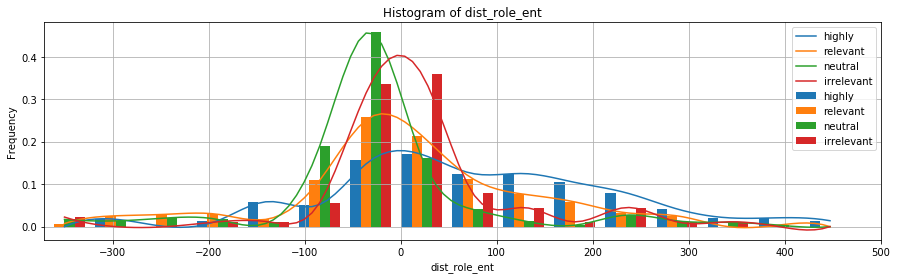

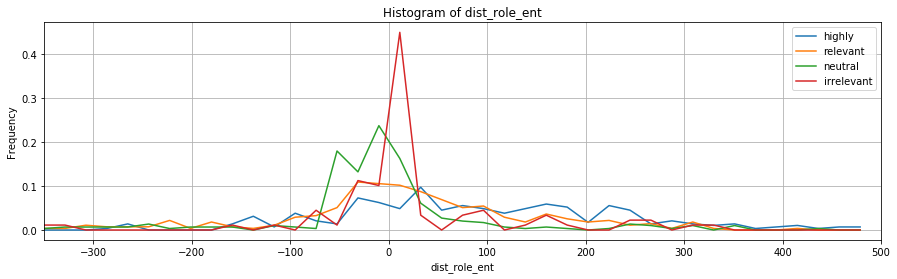

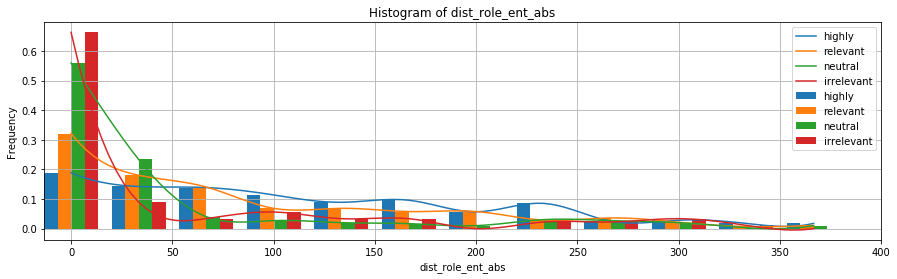

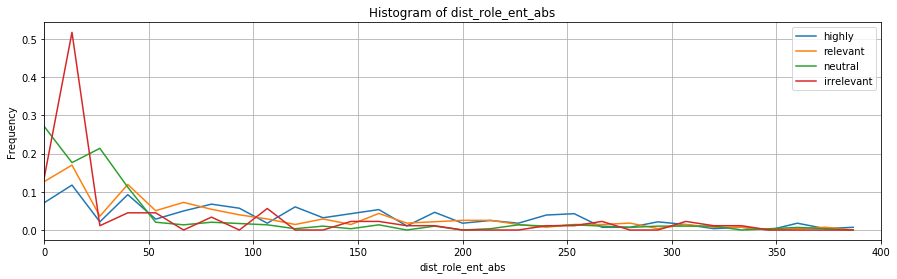

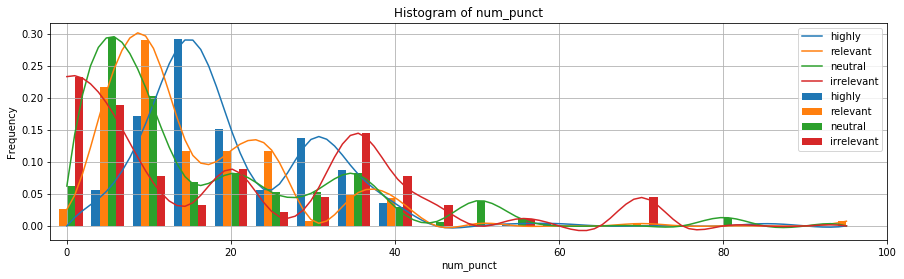

...

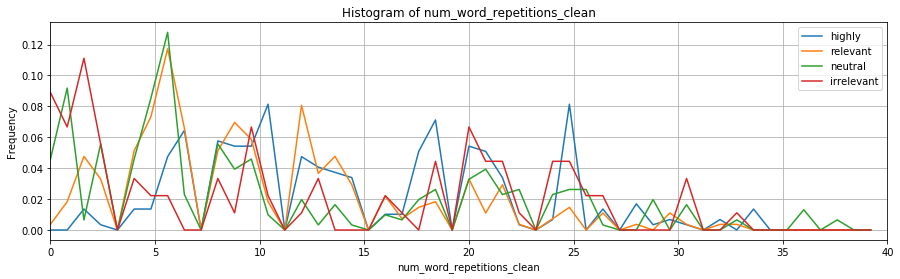

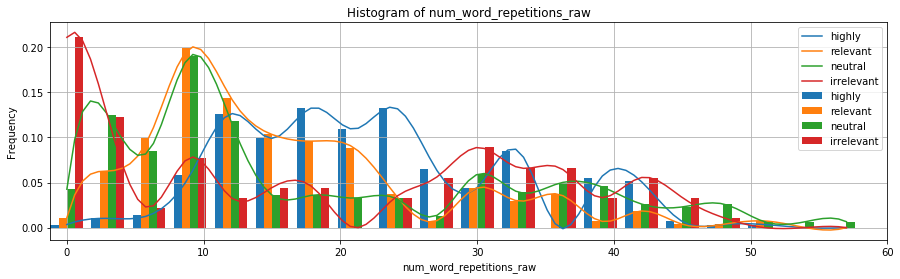

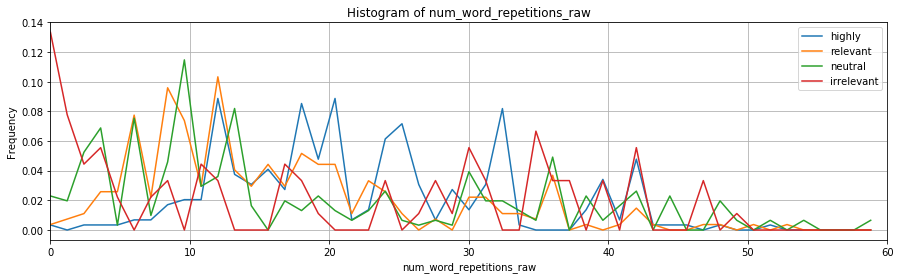

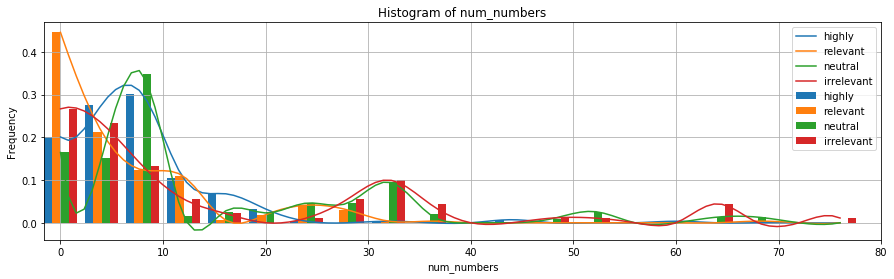

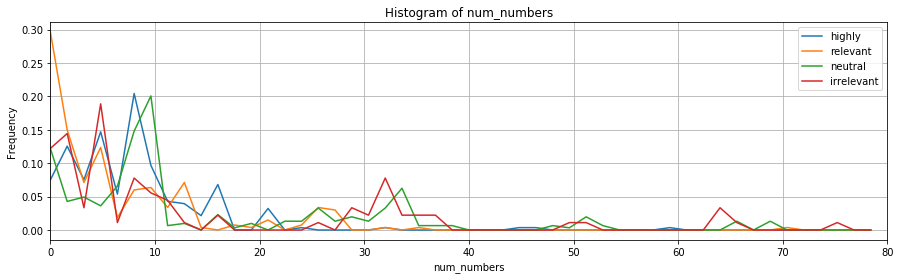

In [54]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from scipy.interpolate import interp1d

def hplot(feat, n_bins=50, xlim=None, ylim=None, bars=False, src=None, bindiv=1):
    plt.figure(figsize=(15,4))
    if n_bins>10:
        n_bins = int(n_bins/bindiv)
    if src is None:
        src = xx
    if xlim is None:
        xlim = (min([xxx[feat] for a in ['highly', 'relevant',  'neutral','irrelevant'] for xxx in src[a]]),
                max([xxx[feat] for a in ['highly', 'relevant',  'neutral','irrelevant'] for xxx in src[a]]))
    for ai, a in enumerate(['highly', 'relevant',  'neutral','irrelevant']):
        x = np.array([xxx[feat] for xxx in src[a]])
        n, bins = np.histogram(x, n_bins, range=xlim)
        n = n/n.sum()
        linspace = np.linspace(bins[0], bins[-2], num=100, endpoint=True)
        if bars:
            width = (bins[1]-bins[0])/5
            l = plt.bar(bins[:-1]+width*ai-width-width/2, n, width, label=a)
            f = interp1d(bins[:-1], n, kind='cubic') # slinear
            l = plt.plot(linspace, f(linspace), label=a)
        else:
            width = 0
            f = interp1d(bins[:-1], n, kind='cubic')
            l = plt.plot(bins[:-1], f(bins[:-1]), label=a)

    plt.xlabel(feat)
    plt.ylabel('Frequency')
    plt.title('Histogram of ' + feat)
    if xlim is not None:
        plt.xlim(xlim[0]-2*width, xlim[1])
    plt.legend()
    plt.grid(True)
    plt.show()

for feat, xlim, n_bins in [
    ('dist_role_ent', (-350, 500), 40),
    ('dist_role_ent_abs', (0, 400), 30),
    ('num_punct', (0,100), 50),
    ('num_1letter', (0,20), 20),
    ('num_role_mentions', None, 8),
    ('role+ent', None, 10),
    ('num_ents_org', (0,17), 10),
    ('num_ents_person', (0,10), 10),
    ('num_verbs', (0,30), 20),
    ('num_adverbs', (0,8), 4),
    ('num_adj', (0,30), 15),
    ('ratio_upper_words', (0,0.8), 50),
    ('ratio_word_repetitions_raw', None, 50),
    ('ratio_digits',(0,0.15), 50),
    ('num_upper_words', (0,150), 50),
    ('num_words', (0,400), 40),
    ('ratio_upper_chars', (0,0.15), 50),
    ('ratio_word_repetitions_clean', None, 50),
    ('num_dollarsigns', (0,20), 20),
    ('ratio_numbers', None, 50),
    ('num_digits', (0,165), 50),
    ('num_chars', (0,2000), 50),
    ('mean_word_len',None, 50),
    ('num_upper_chars',(0,150), 50),
    ('num_word_repetitions_clean', (0,40), 50),
    ('num_word_repetitions_raw',(0,60), 50),
    ('num_numbers', (0,80), 50)]:

    hplot(feat,n_bins=n_bins, xlim=xlim, bars=True, bindiv=2.5)
    hplot(feat,n_bins=n_bins, xlim=xlim)
    #pass

#hplot('num_words', xlim=(0,350), n_bins=20, bars=True)
#hplot('num_words', xlim=(0,350), n_bins=50, bars=False)

# Confusion Matrix

In [39]:
m = {
    'highly': 3,
    'relevant': 2,
    'neutral': 1,
    'irrelevant': 0
}
sf = ft.SyntaxFeatures(n_workers=8, asfrm=True)
tr_x = sf.transform(data.train_full) # [sf._features((r,row)) for r,row in data.train_full.iterrows()]
tr_y = [m[row['rating']] for r, row in data.train_full.iterrows()]
te_x = sf.transform(data.test) # [sf._features((r,row)) for r,row in data.test.iterrows()]
te_y = [m[row['rating']] for r, row in data.test.iterrows()]

In [96]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
# brute 6 (2) 0.5355
#selfeats = ['num_1letter', 'ratio_digits', 'ratio_upper_chars', 'num_adverbs', 'num_dollarsigns', 'num_adj']
#brute 8 0.5177
#selfeats = ['num_ents_person', 'num_words', 'ratio_upper_words', 'num_adverbs', 'num_punct', 'num_ents_org', 'num_digits', 'num_verbs'] # brute8
#brute 19 0.5244
#selfeats = ['num_upper_words', 'num_chars', 'num_words', 'ratio_word_repetitions_clean', 'num_role_mentions', 'num_adj', 'mean_word_len', 'num_ents_person', 'ratio_digits', 'ratio_upper_words', 'num_1letter', 'num_word_repetitions_clean', 'ratio_word_repetitions_raw', 'ratio_upper_chars', 'num_numbers', 'num_dollarsigns', 'role+ent', 'num_word_repetitions_raw', 'num_upper_chars']
#brute 20 0.5177
#selfeats = ['num_upper_words', 'ratio_word_repetitions_raw', 'mean_word_len', 'role+ent', 'num_verbs', 'num_word_repetitions_raw', 'ratio_numbers', 'num_punct', 'ratio_digits', 'num_role_mentions', 'ratio_word_repetitions_clean', 'num_word_repetitions_clean', 'num_adj', 'num_ents_org', 'num_digits', 'num_numbers', 'num_dollarsigns', 'num_words', 'num_upper_chars', 'num_adverbs']
selfeats=b
clf = RandomForestClassifier(n_estimators=20,criterion='entropy',
                             class_weight='balanced', random_state=177, max_features='auto')
clf = clf.fit(tr_x[selfeats], tr_y)
print('accuracy:', accuracy_score(te_y, clf.predict(te_x[selfeats])))
sorted(list(zip(sf.features_,clf.feature_importances_)),key = lambda t: t[1], reverse=True)

accuracy: 0.453333333333


[('num_word_repetitions_raw', 0.08380475077647323),
 ('num_words', 0.071937068021557263),
 ('dist_role_ent_abs', 0.071005858563278956),
 ('dist_role_ent', 0.063316912261422151),
 ('num_adj', 0.062175001955320795),
 ('num_adverbs', 0.060984422841260919),
 ('num_dollarsigns', 0.05923671265157826),
 ('num_chars', 0.056020952461180218),
 ('num_ents_org', 0.054333553547364001),
 ('num_word_repetitions_clean', 0.048334329028355202),
 ('num_ents_person', 0.047614161948278604),
 ('num_punct', 0.047552981724186226),
 ('num_digits', 0.047376336007903384),
 ('mean_word_len', 0.047193903348116704),
 ('num_1letter', 0.041971308465732507),
 ('num_numbers', 0.037536514873556991),
 ('num_upper_words', 0.035477893052757656),
 ('num_verbs', 0.026778400147737986),
 ('num_upper_chars', 0.021954681036965795),
 ('num_role_mentions', 0.015394257286973159)]

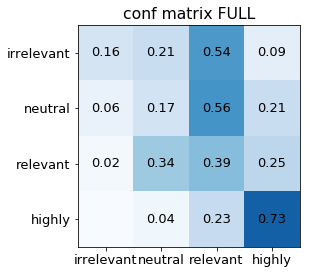

In [103]:
%matplotlib inline
from matplotlib import cm as colm
import matplotlib

conf_matrix_full = confusion_matrix(te_y, clf.predict(te_x[selfeats]), labels=[0,1,2,3])

matplotlib.rc('font', **{'size':13})
plt.figure(figsize=(6,4))
sub = plt.subplot(111)
normed = (conf_matrix_full.T/conf_matrix_full.sum(axis=1)).T
plt.imshow(normed, cmap=colm.Blues, vmax=0.9)
plt.title('conf matrix FULL')
sub.set_yticks([0,1,2,3])
sub.set_yticklabels(['irrelevant', 'neutral','relevant', 'highly'])
sub.set_xticks([0,1,2,3])
sub.set_xticklabels(['irrelevant', 'neutral','relevant', 'highly'])

for i in range(normed.shape[0]):
    for j in range(normed.shape[1]):
        v = normed.T[i][j]
        c='%.2f'%v if v>0.005 else ''
        sub.text(i, j, c, va='center', ha='center')
        
plt.tight_layout()
plt.show()

irrelevant 80
neutral 142
relevant 369
highly 309


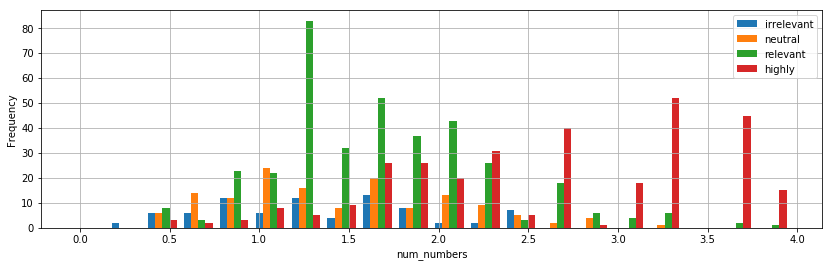

In [115]:
### %matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from scipy.interpolate import interp1d

p = clf.predict_proba(te_x[selfeats])
p = (p.argmax(1)+1)*p.max(axis=1)
p = list(zip(te_y, p))
n_bins = 20
plt.figure(figsize=(14,4))
for ai, a in enumerate(reversed(['highly', 'relevant',  'neutral','irrelevant'])):
    x = np.array([pp[1] for pp in p if pp[0] == ai])
    n, bins = np.histogram(x, n_bins, range=(0,4))
    width = (bins[1]-bins[0])/5
    print(a, len(x))
    #n = n/n.sum()
    #f = interp1d(bins[:-1], n, kind='cubic')
    #l = plt.plot(bins[:-1], f(bins[:-1]), label=a)
    l = plt.bar(bins[:-1]+width*ai, n, width, label=a)

plt.xlabel(feat)
plt.ylabel('Frequency')
#plt.xlim(xlim[0], xlim[1])
plt.legend()
plt.grid(True)
plt.show()

In [82]:
bins

array([ 0.4 ,  0.76,  1.12,  1.48,  1.84,  2.2 ,  2.56,  2.92,  3.28,
        3.64,  4.  ])

# Scatter Plot

In [41]:

sf = ft.SyntaxFeatures(n_workers=1)
feats= dict()
for a in ['highly', 'relevant',  'neutral','irrelevant']:
    feats[a] = [sf._features((r,row)) for r,row in data.test[data.test['rating']==a].iterrows()]
print('done')

done


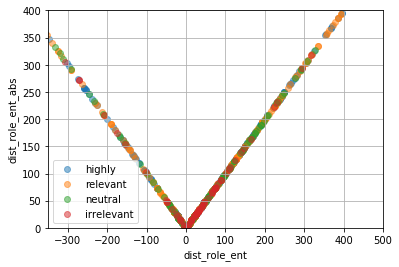

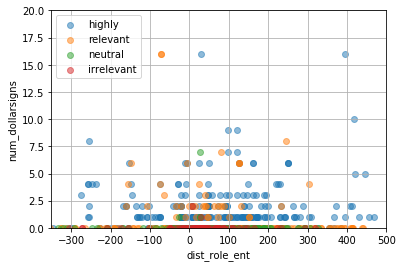

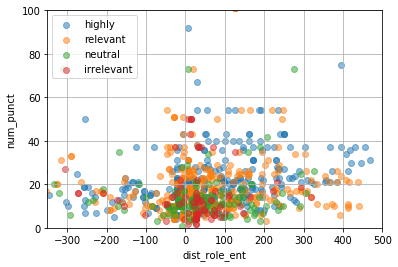

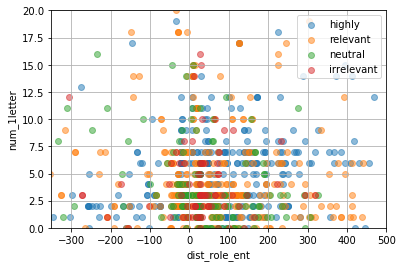

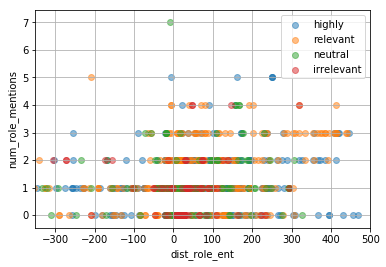

...

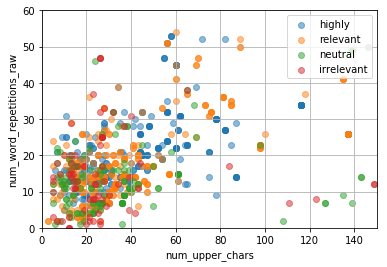

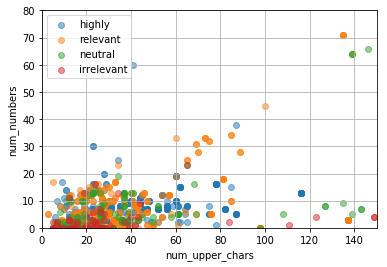

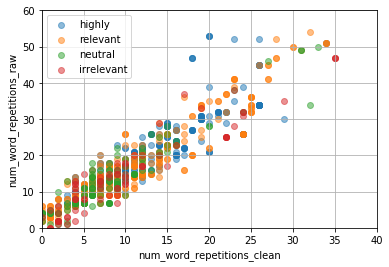

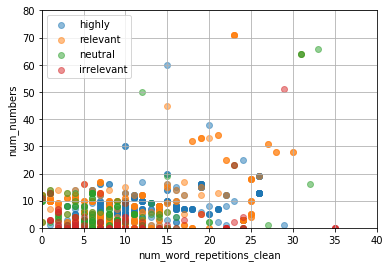

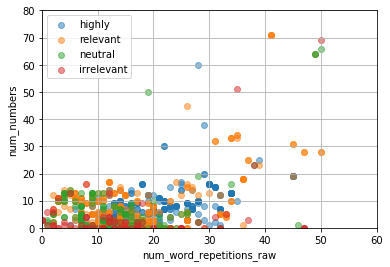

In [42]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from scipy.interpolate import interp1d

def splot(feat_x, feat_y, xlim=None, ylim=None):
    for a in ['highly', 'relevant',  'neutral','irrelevant']:
        x = np.array([ff[feat_x] for ff in feats[a]])
        y = np.array([ff[feat_y] for ff in feats[a]])
        
        plt.scatter(x, y, label=a,alpha=.5)
        
    plt.xlabel(feat_x)
    plt.ylabel(feat_y)
    if xlim is not None:
        plt.xlim(xlim[0], xlim[1])
    if ylim is not None:
        plt.ylim(ylim[0], ylim[1])
    plt.legend()
    plt.grid(True)
    plt.show()

lst = [
    ('dist_role_ent', (-350, 500)),
    ('dist_role_ent_abs', (0, 400)),
    ('num_dollarsigns', (0,20)),
    ('num_punct', (0,100)),
    ('num_1letter', (0,20)),
    ('num_role_mentions', None),
    ('role+ent', None),
    ('num_ents_org', (0,17)),
    ('num_ents_person', (0,10)),
    ('num_verbs', (0,30)),
    ('num_adverbs', (0,8)),
    ('num_adj', (0,30)),
    ('ratio_upper_words', None),
    ('ratio_word_repetitions_raw', None),
    ('ratio_digits',(0,0.15)),
    ('num_upper_words', (0,150)),
    ('num_words', (0,250)),
    ('ratio_upper_chars', (0,0.15)),
    ('ratio_word_repetitions_clean', None),
    ('ratio_numbers', (0,0.4)),
    ('num_digits', (0,165)),
    ('num_chars', (0,2000)),
    ('mean_word_len',None),
    ('num_upper_chars',(0,150)),
    ('num_word_repetitions_clean', (0,40)),
    ('num_word_repetitions_raw',(0,60)),
    ('num_numbers', (0,80))]
for xi in range(len(lst)):
    #for yi in range(len(lst)):
    for yi in range(xi, len(lst)):
        if xi != yi:
            splot(lst[xi][0], lst[yi][0], ylim=lst[yi][1], xlim=lst[xi][1])

# Feature Selection

In [57]:

from sklearn.feature_selection import SelectFromModel
m = {
    'highly': 3,
    'relevant': 2,
    'neutral': 1,
    'irrelevant': 0
}
sf = ft.SyntaxFeatures(n_workers=8, asfrm=True)
tr_x = sf.transform(data.train_full) # [sf._features((r,row)) for r,row in data.train_full.iterrows()]
tr_y = [m[row['rating']] for r, row in data.train_full.iterrows()]
te_x = sf.transform(data.test) # [sf._features((r,row)) for r,row in data.test.iterrows()]
te_y = [m[row['rating']] for r, row in data.test.iterrows()]

In [58]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
clf = RandomForestClassifier(n_estimators=20,criterion='entropy', class_weight='balanced', random_state=177,max_features='auto')
clf = clf.fit(tr_x, tr_y)
print('accuracy:', accuracy_score(te_y, clf.predict(te_x)))
sorted(list(zip(sf.features_,clf.feature_importances_)),key = lambda t: t[1], reverse=True)

accuracy: 0.473333333333


[('ratio_numbers', 0.065335720649668513),
 ('ratio_upper_words', 0.059275810341101874),
 ('num_words', 0.058316566934585777),
 ('num_chars', 0.05491706082397043),
 ('ratio_digits', 0.05303692888023305),
 ('num_digits', 0.052390793180270713),
 ('num_numbers', 0.04864325031608209),
 ('ratio_word_repetitions_raw', 0.045579929868371463),
 ('ratio_upper_chars', 0.040346110033064805),
 ('dist_role_ent', 0.040039367174978892),
 ('num_dollarsigns', 0.038830177293668132),
 ('num_verbs', 0.03799503989184274),
 ('num_punct', 0.037978801986226177),
 ('dist_role_ent_abs', 0.037493653318682901),
 ('num_ents_org', 0.03519672987511524),
 ('mean_word_len', 0.03355137038308334),
 ('num_upper_chars', 0.033278367384161164),
 ('num_upper_words', 0.031774888250761323),
 ('num_adj', 0.029944654682499385),
 ('ratio_word_repetitions_clean', 0.029728863754297348),
 ('num_word_repetitions_raw', 0.028820432578474525),
 ('num_word_repetitions_clean', 0.027084563476098139),
 ('num_1letter', 0.024663695411057764),
 

In [59]:
model = SelectFromModel(clf, prefit=True)
print(accuracy_score(te_y, model.estimator.predict(te_x)))
X_new = model.transform(tr_x)
X_new.shape

0.473333333333


(975, 14)

In [60]:
model.threshold_

0.037037037037037042

In [38]:
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

sorted([(f, accuracy_score(te_y, RandomForestClassifier(n_estimators=10,
                                                        class_weight='balanced',
                                                        random_state=177,
                                                        criterion='entropy',
                                                        max_features='auto'
).fit(tr_x[[f]], tr_y).predict(te_x[[f]]))) for f in sf.features_], key=lambda t: t[1], reverse=True)

[('dist_role_ent', 0.37555555555555553),
 ('num_ents_person', 0.37111111111111111),
 ('num_dollarsigns', 0.36888888888888888),
 ('num_adj', 0.3511111111111111),
 ('ratio_word_repetitions_raw', 0.3511111111111111),
 ('dist_role_ent_abs', 0.34888888888888892),
 ('ratio_numbers', 0.34444444444444444),
 ('ratio_upper_words', 0.33777777777777779),
 ('ratio_digits', 0.33666666666666667),
 ('num_punct', 0.33111111111111113),
 ('num_chars', 0.32666666666666666),
 ('role+ent', 0.32000000000000001),
 ('num_word_repetitions_clean', 0.31555555555555553),
 ('num_digits', 0.30555555555555558),
 ('num_upper_chars', 0.30111111111111111),
 ('ratio_word_repetitions_clean', 0.29888888888888887),
 ('num_words', 0.29777777777777775),
 ('num_word_repetitions_raw', 0.28999999999999998),
 ('num_ents_org', 0.28444444444444444),
 ('num_verbs', 0.28111111111111109),
 ('num_role_mentions', 0.28000000000000003),
 ('num_upper_words', 0.27444444444444444),
 ('mean_word_len', 0.2722222222222222),
 ('num_numbers', 0.2

In [39]:
from sklearn.feature_selection import VarianceThreshold
sorted(list(zip(sf.features_,VarianceThreshold().fit(tr_x).variances_)),key = lambda t: t[1], reverse=True)

[('num_chars', 2060960.0860339252),
 ('dist_role_ent', 85140.145131886922),
 ('dist_role_ent_abs', 71698.880027350431),
 ('num_words', 46949.623904273503),
 ('num_digits', 40009.319790664049),
 ('num_numbers', 7769.1260865220247),
 ('num_punct', 7166.7971871137397),
 ('num_upper_chars', 2070.9729914529912),
 ('num_upper_words', 1442.7517307034843),
 ('num_word_repetitions_raw', 594.43748691650239),
 ('num_adj', 230.31216305062455),
 ('num_word_repetitions_clean', 147.68439289940827),
 ('num_dollarsigns', 113.77885496383956),
 ('num_verbs', 105.28343563445104),
 ('num_1letter', 36.268297172912554),
 ('num_ents_org', 21.486920710059174),
 ('num_ents_person', 10.903115318869165),
 ('num_adverbs', 4.3921062458908606),
 ('num_role_mentions', 1.4929609467455622),
 ('role+ent', 0.33292202498356344),
 ('mean_word_len', 0.1701348549304339),
 ('ratio_upper_words', 0.022955924085482891),
 ('ratio_numbers', 0.012116322644091961),
 ('ratio_word_repetitions_clean', 0.0044467781902558286),
 ('ratio_w

In [73]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
b = SelectKBest(chi2, k=20)
b.fit(tr_x.abs(), tr_y)
print([f for f,i in sorted(list(zip(sf.features_,b.scores_)),key = lambda t: t[1], reverse=True)])
sorted(list(zip(sf.features_,b.scores_)),key = lambda t: t[1], reverse=True)

['num_chars', 'num_digits', 'dist_role_ent', 'dist_role_ent_abs', 'num_words', 'num_numbers', 'num_punct', 'num_adj', 'num_dollarsigns', 'num_verbs', 'num_word_repetitions_raw', 'num_word_repetitions_clean', 'num_ents_org', 'num_ents_person', 'num_adverbs', 'num_upper_words', 'num_1letter', 'num_upper_chars', 'ratio_upper_words', 'ratio_numbers', 'num_role_mentions', 'role+ent', 'ratio_digits', 'ratio_upper_chars', 'ratio_word_repetitions_raw', 'ratio_word_repetitions_clean', 'mean_word_len']


[('num_chars', 41645.631049199175),
 ('num_digits', 8690.8361925442441),
 ('dist_role_ent', 6373.9147069752235),
 ('dist_role_ent_abs', 6373.9147069752235),
 ('num_words', 5801.3886519744519),
 ('num_numbers', 4226.4846814459479),
 ('num_punct', 3665.5504662821631),
 ('num_adj', 1163.394810264464),
 ('num_dollarsigns', 1111.1266818434485),
 ('num_verbs', 400.5029516662479),
 ('num_word_repetitions_raw', 214.97939814936777),
 ('num_word_repetitions_clean', 143.82404283168546),
 ('num_ents_org', 135.13041346645542),
 ('num_ents_person', 126.23950204327716),
 ('num_adverbs', 124.06623195484394),
 ('num_upper_words', 46.175863449559309),
 ('num_1letter', 40.461512100823356),
 ('num_upper_chars', 39.86750207638967),
 ('ratio_upper_words', 9.8586693806239474),
 ('ratio_numbers', 9.5014347980052207),
 ('num_role_mentions', 8.0085537053592439),
 ('role+ent', 6.8790739385676769),
 ('ratio_digits', 2.2496331860990817),
 ('ratio_upper_chars', 1.4484943699386785),
 ('ratio_word_repetitions_raw', 0

In [29]:
for k in range(3,25):
    b = SelectKBest(chi2, k=k)
    b.fit(tr_x.abs(), tr_y)
    clf = RandomForestClassifier(n_estimators=20,criterion='entropy', random_state=177, class_weight='balanced', max_features='auto')
    clf = clf.fit(b.transform(tr_x), tr_y)
    print(k,'accuracy:', accuracy_score(te_y, clf.predict(b.transform(te_x))))

3 accuracy: 0.422222222222
4 accuracy: 0.411111111111
5 accuracy: 0.43
6 accuracy: 0.441111111111
7 accuracy: 0.406666666667
8 accuracy: 0.433333333333
9 accuracy: 0.441111111111
10 accuracy: 0.45
11 accuracy: 0.463333333333
12 accuracy: 0.456666666667
13 accuracy: 0.454444444444
14 accuracy: 0.482222222222
15 accuracy: 0.49
16 accuracy: 0.456666666667
17 accuracy: 0.442222222222
18 accuracy: 0.472222222222
19 accuracy: 0.495555555556
20 accuracy: 0.465555555556
21 accuracy: 0.468888888889
22 accuracy: 0.445555555556
23 accuracy: 0.458888888889
24 accuracy: 0.456666666667


In [33]:
clf = RandomForestClassifier(n_estimators=20,criterion='entropy', random_state=177,class_weight='balanced', max_features='auto')
clf = clf.fit(tr_x, tr_y)
print('accuracy:', accuracy_score(te_y, clf.predict(te_x)))

accuracy: 0.473333333333


In [64]:
[f for f, i in zip(sf.features_,clf.feature_importances_) if i > model.threshold_]

['dist_role_ent',
 'dist_role_ent_abs',
 'num_chars',
 'num_digits',
 'num_dollarsigns',
 'num_numbers',
 'num_punct',
 'num_verbs',
 'num_words',
 'ratio_digits',
 'ratio_numbers',
 'ratio_upper_chars',
 'ratio_upper_words',
 'ratio_word_repetitions_raw']